In [91]:
import sys
import glob
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import colors
import numpy as np
from skimage import exposure
import rasterio as rio
from osgeo import gdal, osr
from pyproj import Transformer, CRS

path_to_directory = '/Volumes/MIT/dynnet'
sys.path.append(path_to_directory)

from data.utae_dynamicen import DynamicEarthNet

### Data

In [4]:
label_names = ['Impervious surface','Agriculture','Forest & other vegetation','Wetlands','Soil','Water','Snow & ice','No Change']
label_colors = [
    '5A5A5A',
    'F0E68C',
    '228B22',
    '191970',
    'A0522D',
    '1E90FF',
    'B0C4DE',
    'C0C0C0',
    ]

def hex_to_rgb(hex):
    return tuple(int(hex[i:i+2], 16)/255 for i in (0, 2, 4)) + (1.0,)

label_rgb = [hex_to_rgb(clr) for clr in label_colors]
print(len(label_rgb))

8


In [5]:
# Rescale surface reflectance values for plotting with color balance
def rescale(img, low=1, high=99):
    p_low, p_high = np.percentile(img, (low, high))
    return exposure.rescale_intensity(img, in_range=(p_low, p_high))

In [6]:
def make_labels(labels, num_classes=7):
    mask = np.zeros(labels[0].shape)
    for i in range(labels.shape[0]):
        mask[labels[i, :, :] == 255] = i
    return mask.astype(int)

In [64]:
def get_bounding_box(raster):
    transform = raster.GetGeoTransform()

    x_min = transform[0]
    y_max = transform[3]
    x_max = x_min + transform[1] * raster.RasterXSize
    y_min = y_max + transform[5] * raster.RasterYSize

    return (x_min, y_min, x_max, y_max)

#### Test single file

In [7]:
test_file = '/Volumes/MIT/dynnet/data/reprocess-cropped/UTM-24000/10N/23E-188N/1311_3077_13/PF-SR/2019-12-01.tif'
test_labels = '/Volumes/MIT/dynnet/data/labels/1311_3077_13_10N/Labels/Raster/10N-122W-40N-L3H-SR/10N-122W-40N-L3H-SR-2019_12_01.tif'

In [102]:
# Get lat lon coordinates

raster = gdal.Open(test_file)

# Get raster dimensions in pixels
width_in_pixels = raster.RasterXSize
height_in_pixels = raster.RasterYSize

geotransform = raster.GetGeoTransform()
origin_easting = geotransform[0]
origin_northing = geotransform[3]
pixel_width = geotransform[1]  # Size of one pixel in the x-direction in map units
pixel_height = abs(geotransform[5])  # Size of one pixel in the y-direction in map units (abs for positive value)
# Calculate the width and height in meters
width_in_meters = pixel_width * width_in_pixels
height_in_meters = pixel_height * height_in_pixels

spatial_ref = raster.GetProjectionRef()
sr = osr.SpatialReference(wkt=spatial_ref)
sr.AutoIdentifyEPSG()
epsg_code = sr.GetAuthorityCode(None)

# Define CRS using the modern syntax
utm_crs = CRS(f'epsg:{epsg_code}')  # UTM zone 10N, for example
wgs84_crs = CRS('EPSG:4326')  # WGS 84

# Calculate UTM coordinates for each corner
corners_utm = [
    (origin_easting, origin_northing),  # Top-Left
    (origin_easting + width_in_meters, origin_northing),  # Top-Right
    (origin_easting, origin_northing - height_in_meters),  # Bottom-Left
    (origin_easting + width_in_meters, origin_northing - height_in_meters),  # Bottom-Right
]
center = (origin_easting + width_in_meters/2, origin_northing-height_in_meters/2)

# Transform each corner to lat, lon
corners_lat_lon = [transformer.transform(easting, northing) for easting, northing in corners_utm]
center_lat_lon = transformer.transform(center[0], center[1])

# Print the results
for i, (lon, lat) in enumerate(corners_lat_lon, start=1):
    print(f"Corner {i}: Latitude {lat}, Longitude {lon}")
print(f"Center: Latitude {center_lat_lon[1]}, Longitude {center_lat_lon[0]}")

Corner 1: Latitude 40.81111016511891, Longitude -122.38379616905675
Corner 2: Latitude 40.81090989944981, Longitude -122.34737496864368
Corner 3: Latitude 40.783437481832124, Longitude -122.38405200618716
Corner 4: Latitude 40.7832374103324, Longitude -122.34764592468271
Center: Latitude 40.797175192282474, Longitude -122.36571726714256


In [100]:
# Read the file with Rasterio
with rio.open(test_file) as src:
    print(src.meta)
    # From the open src image, let's save the array as a variable.
    img = src.read()/10000 #true surface reflectance
    red = img[2]
    green = img[1]
    blue = img[0]
    nir = img[3]
    image = np.dstack((red, green, blue, nir))
    rgb = np.dstack((red, green, blue))
    norm_rgb = (rgb - np.min(rgb))/(np.max(rgb) - np.min(rgb))
    rs_rgb = rescale(norm_rgb)
    
with rio.open(test_labels) as src:
    print(src.meta)
    # From the open src image, let's save the array as a variable.
    labels = src.read()
    labels = make_labels(labels)
    print(labels.shape)

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 4, 'crs': CRS.from_epsg(32610), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 1024, 'height': 1024, 'count': 7, 'crs': CRS.from_epsg(32610), 'transform': Affine(3.0, 0.0, 551971.4999999972,
       0.0, -3.0, 4517971.500000001)}
(1024, 1024)


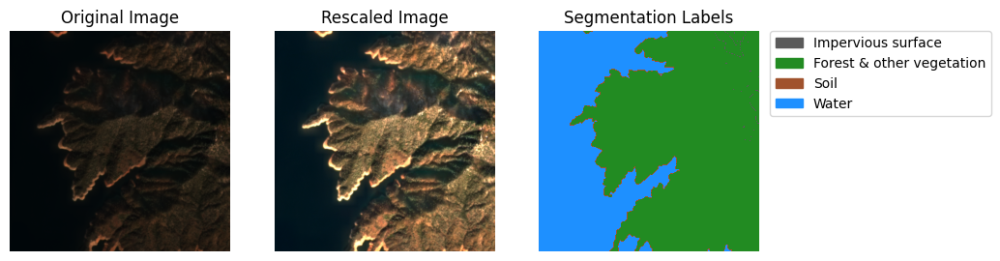

In [101]:
# Show original image
plt.figure(figsize=(10,10))
plt.subplot(1, 3, 1)
plt.imshow(norm_rgb)
plt.title('Original Image')
plt.axis('off')

# Show rescaled image
plt.subplot(1, 3, 2)
plt.imshow(rs_rgb)
plt.title('Rescaled Image')
plt.axis('off')

# Show segmentation labels
plt.subplot(1, 3, 3)

# Unique labels
unique_labels = np.unique(labels)
rgbs = [label_rgb[label_num] for label_num in unique_labels]

# Create a color map
cmap = colors.ListedColormap(rgbs)

# Create legend handles
handles = [mpatches.Patch(color=label_rgb[label_num], label=label_names[label_num]) for label_num in unique_labels]

# Plot
plt.imshow(labels, cmap=cmap)
plt.title('Segmentation Labels')
plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.axis('off')
plt.show()

#### Time series (monthly)

In [10]:
data_dir = '/Volumes/MIT/dynnet/data/reprocess-cropped/UTM-24000/15N/30E-66N/2029_3764_13/PF-SR'
label_dir = '/Volumes/MIT/dynnet/data/labels/2029_3764_13_15N/Labels/Raster/15N-90W-14N-L3H-SR'

In [11]:
data_files = glob.glob(f'{data_dir}/*01.tif')
data_files.sort()
label_files = glob.glob(f'{label_dir}/*01.tif')
label_files.sort()
print(len(data_files))
print(len(label_files))

24
24


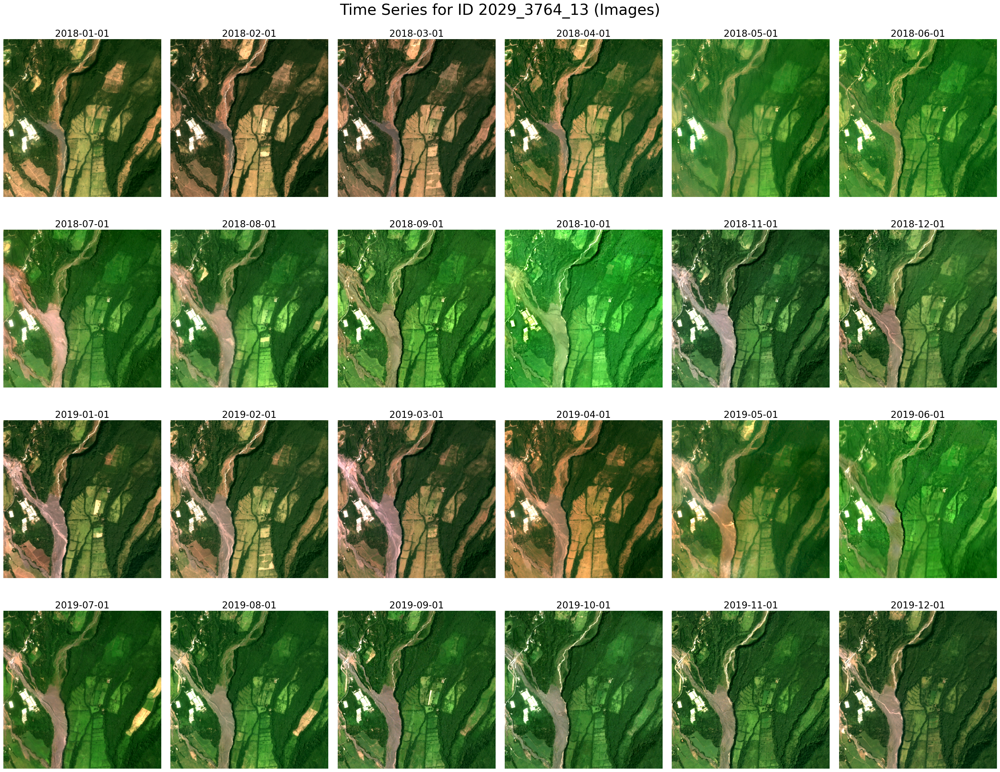

In [12]:
# Define the layout of our figure
nrow = 4
ncol = 6
f, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 6*nrow))

# Loop over every band name and axis available in the plot together
for file_name, label_name, ax in zip(data_files, label_files, axes.flatten()):
    ax.axis('off')
    
    # Read data
    with rio.open(file_name) as src:
        # From the open src image, let's save the array as a variable.
        img = src.read()/10000 #true surface reflectance
        red = img[2]
        green = img[1]
        blue = img[0]
        nir = img[3]
        image = np.dstack((red, green, blue, nir))
        rgb = np.dstack((red, green, blue))
        norm_rgb = (rgb - np.min(rgb))/(np.max(rgb) - np.min(rgb))
        rs_rgb = rescale(norm_rgb)

    im = ax.imshow(rs_rgb)
    
    ax.set_title(file_name[-14:-4], fontsize=20)

plt.subplots_adjust(wspace=0.2)
f.suptitle(f'Time Series for ID {data_dir[-18:-6]} (Images)', fontsize=32)
plt.tight_layout(pad=2)
plt.show()

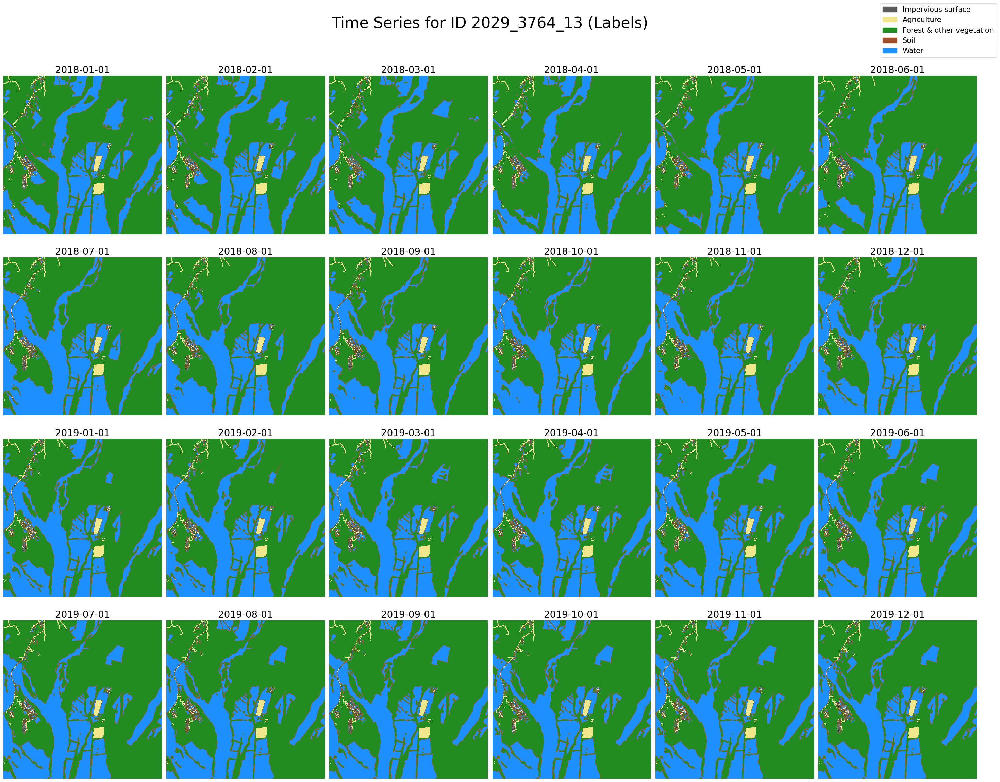

In [13]:
# Define the layout of our figure
nrow = 4
ncol = 6
f, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 6*nrow))

# Loop over every band name and axis available in the plot together
for file_name, label_name, ax in zip(data_files, label_files, axes.flatten()):

    # Read labels
    with rio.open(label_name) as src:
        # From the open src image, let's save the array as a variable.
        labels = src.read()
        labels = make_labels(labels)

    # Unique labels
    unique_labels = np.unique(labels)
    rgbs = [label_rgb[label_num] for label_num in unique_labels]

    # Create a color map
    cmap = colors.ListedColormap(rgbs)

    # Create legend handles
    handles = [mpatches.Patch(color=label_rgb[label_num], label=label_names[label_num]) for label_num in unique_labels]

    im = ax.imshow(labels, cmap=cmap)

    ax.axis('off')
    ax.set_title(file_name[-14:-4], fontsize=20)

plt.subplots_adjust(wspace=0.2)
f.legend(handles, [label_names[num] for num in unique_labels], fontsize=15, loc='upper right') #bbox_to_anchor=(0.57,0.97)
f.suptitle(f'Time Series for ID {data_dir[-18:-6]} (Labels)', fontsize=32)
plt.tight_layout(pad=5, h_pad=2, w_pad=1.0)
plt.show()

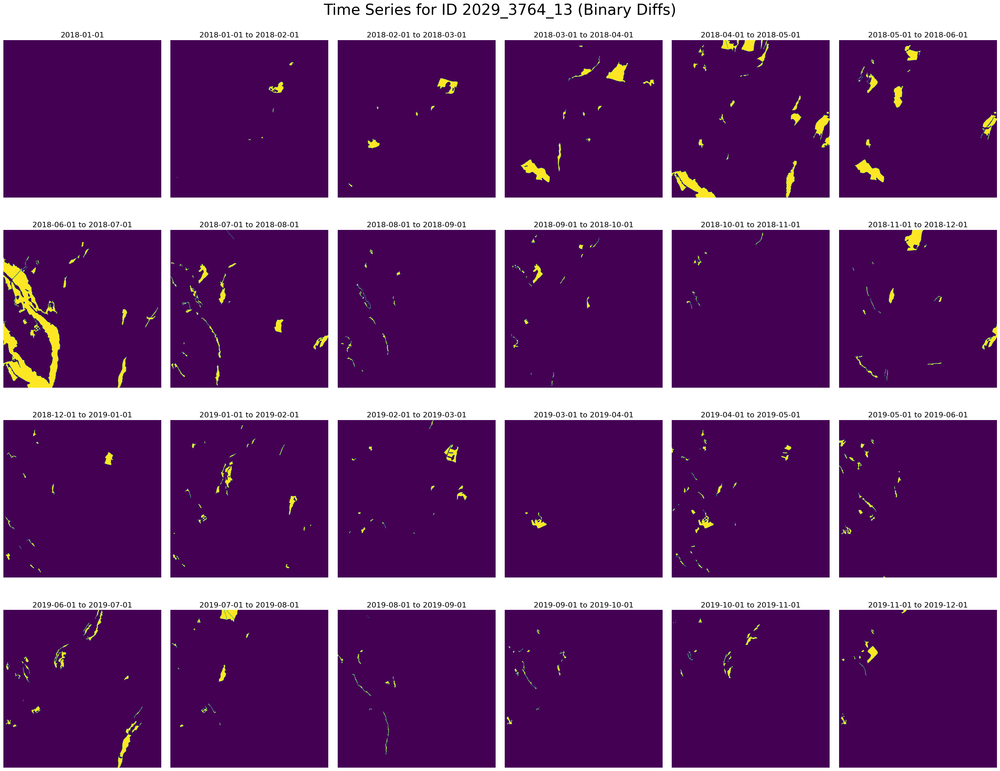

In [141]:
# Define the layout of our figure
nrow = 4
ncol = 6
f, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 6*nrow))

# Loop over every band name and axis available in the plot together
i = 0
for file_name, label_name, ax in zip(data_files, label_files, axes.flatten()):

    # Read labels
    with rio.open(label_name) as src:
        # From the open src image, let's save the array as a variable.
        labels = src.read()
        labels = make_labels(labels)

    if i == 0:
        filler = np.zeros(labels.shape)
        im = ax.imshow(filler)
        ax.set_title(file_name[-14:-4], fontsize=16)
    if i != 0:
        diff = labels != labels_before
        im = ax.imshow(diff)
        labels_before = labels
        i += 1
        ax.set_title(f'{name_before} to {file_name[-14:-4]}', fontsize=16)
    labels_before = labels
    name_before = file_name[-14:-4]
    i+=1

    ax.axis('off')

plt.subplots_adjust(wspace=0.2)
f.suptitle(f'Time Series for ID {data_dir[-18:-6]} (Binary Diffs)', fontsize=32)
plt.tight_layout(pad=2)
plt.show()

In [18]:
cmap = colors.ListedColormap(rgbs)

# Define the bounds for your colors
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5]

# Create a normalization based on the bounds
norm = colors.BoundaryNorm(bounds, cmap.N)

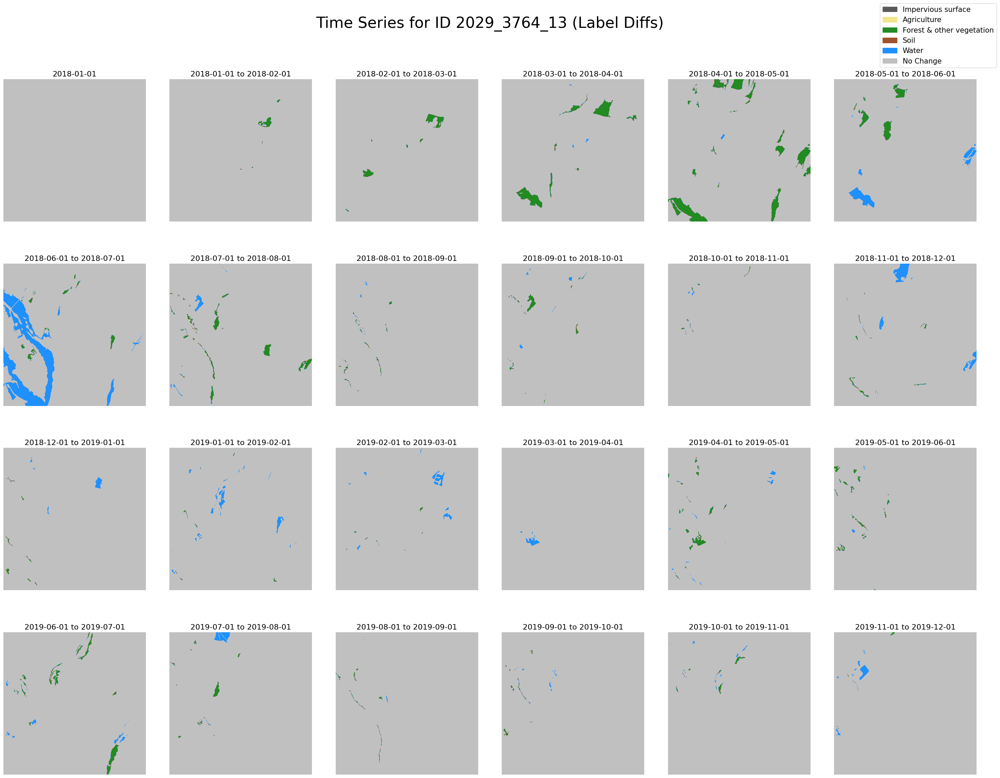

In [19]:
# Define the layout of our figure
nrow = 4
ncol = 6
f, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 6*nrow))
no_change_num = len(label_colors)-1

# Loop over every band name and axis available in the plot together
i = 0
for file_name, label_name, ax in zip(data_files, label_files, axes.flatten()):

    # Read labels
    with rio.open(label_name) as src:
        # From the open src image, let's save the array as a variable.
        labels = src.read()
        labels = make_labels(labels)

    if i == 0:
        # Unique labels
        unique_labels = np.unique(labels)
        unique_labels = np.append(unique_labels, no_change_num)
        rgbs = [label_rgb[label_num] for label_num in unique_labels]
    
        # Create legend handles
        handles = [mpatches.Patch(color=label_rgb[label_num], label=label_names[label_num]) for label_num in unique_labels]

        filler = (np.ones(labels.shape)*no_change_num).astype(int)
        im = ax.imshow(filler,cmap=cmap, norm=norm)
        ax.set_title(file_name[-14:-4], fontsize=16)
        
    if i != 0:
        diff_labels = labels.copy()
        diff_labels[labels==labels_before] = no_change_num
        im = ax.imshow(diff_labels, cmap=cmap, norm=norm)
        labels_before = labels
        ax.set_title(f'{name_before} to {file_name[-14:-4]}', fontsize=16)
    labels_before = labels
    name_before = file_name[-14:-4]
    i+=1

    ax.axis('off')

plt.subplots_adjust(wspace=0.2)
f.suptitle(f'Time Series for ID {data_dir[-18:-6]} (Label Diffs)', fontsize=32)
f.legend(handles, [label_names[num] for num in unique_labels], fontsize=15, loc='upper right') #bbox_to_anchor=(0.57,0.97)
plt.tight_layout(pad=5)
plt.show()

#### Pytorch dataset

In [34]:
train_data = DynamicEarthNet(root='/Volumes/MIT/dynnet/data', mode='val', type='weekly',
                               crop_size=512, num_classes=6,
                               ignore_index=-1)

/Volumes/MIT/dynnet/data/dynnet_training_splits/val.txt


In [35]:
x, labels = train_data.load_data(48)

RasterioIOError: /Volumes/MIT/dynnet/data/labels/2789_4694_13_21S/Labels/Raster/21S-57W-25S-L3H-SR/21S-57W-25S-L3H-SR-2018-01-01.tif: No such file or directory

In [54]:
data_dir = '/Volumes/MIT/dynnet/data/reprocess-cropped/UTM-24000'

In [62]:
files = glob.glob(f'{data_dir}/**/*2789_4694_13*/*', recursive=True)

In [107]:
files = glob.glob('/Users/madelineloui/Downloads/labels/*2789_4694_13*/*', recursive=True)

In [28]:
img, dates = x
print(img.shape) 
img1 = img[0,:,:,:3]
img1 = (img1 - np.min(img1))/(np.max(img1) - np.min(img1))

print(labels.shape)
unique_labels = np.unique(labels)
names = []
for ul in unique_labels:
    names.append(label_names[ul])
print(names)

(6, 1024, 1024, 4)
(1024, 1024)
['Impervious surface', 'Forest & other vegetation', 'Soil', 'Water']


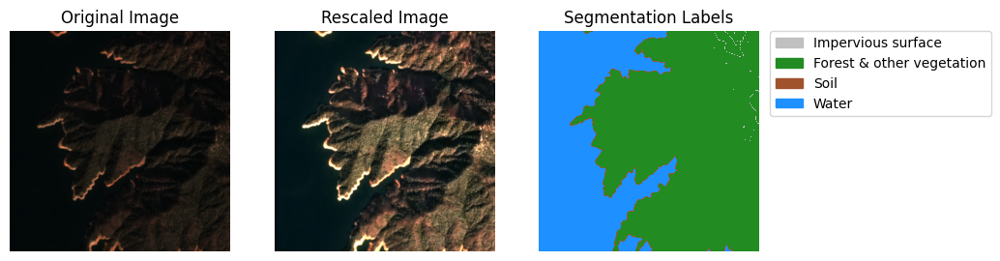

In [16]:
# Show original image
plt.figure(figsize=(10,10))
plt.subplot(1, 3, 1)
plt.imshow(img1)
plt.title('Original Image')
plt.axis('off')

# Show rescaled image
plt.subplot(1, 3, 2)
plt.imshow(rescale(img1))
plt.title('Rescaled Image')
plt.axis('off')

# Show segmentation labels
plt.subplot(1, 3, 3)

# Unique labels
unique_labels = np.unique(labels)
rgbs = [label_rgb[label_num] for label_num in unique_labels]

# Create a color map
cmap = colors.ListedColormap(rgbs)

# Create legend handles
handles = [mpatches.Patch(color=label_rgb[label_num], label=label_names[label_num]) for label_num in unique_labels]

# Plot
plt.imshow(labels, cmap=cmap)
plt.title('Segmentation Labels')
plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.axis('off')
plt.show()